# **COVID Dashboard**

## 1\. Contexto




### **1.1. TLDR**


- **Dashboard**:
  - **Google Data Studio**:  
  [**Clique aqui para visualizar o Dashboard no Looker**](https://lookerstudio.google.com/s/rZU8mOHcw_c)



 - **Fontes**:
  - Casos pela universidade John Hopkins ([link](https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_daily_reports));
  - Vacinação pela universidade de Oxford ([link](https://covid.ourworldindata.org/data/owid-covid-data.csv)).

### **1.2. Pandemia Coronavírus 2019**








A COVID-19, também conhecida como doença do coronavírus 2019, é uma doença infecciosa causada pelo vírus SARS-CoV-2, um membro da família dos coronavírus. Identificada pela primeira vez em dezembro de 2019 na cidade de Wuhan, na China, a COVID-19 rapidamente se espalhou pelo mundo, levando a Organização Mundial da Saúde (OMS) a declarar uma pandemia em março de 2020.

Fontes:


*   OMS (Organização Mundial da Saúde): https://www.who.int/emergencies/diseases/novel-coronavirus-2019
*   CDC (Centro de Controle e Prevenção de Doenças): https://www.cdc.gov/covid/index.html
*   Ministério da Saúde do Brasil: https://www.gov.br/saude/pt-br/assuntos/covid-19

O monitoramento diário de casos e óbitos foi crucial para entender a evolução da COVID-19 e direcionar ações de saúde pública. Com dados atualizados, era possível identificar tendências, avaliar a eficácia de medidas preventivas e adaptar estratégias para conter a disseminação do vírus.

Neste contexto, o projeto propõe uma análise detalhada dos registros de casos e vacinação de 2022. O objetivo é desenvolver um dashboard interativo que permita explorar padrões, comparar indicadores e visualizar de forma clara o impacto da pandemia ao longo do ano. A ferramenta busca não apenas organizar informações, mas também transformar dados brutos em insights acionáveis para pesquisadores, gestores e o público geral.



### **1.3. Dados**

Os dados sobre **casos da COVID-19** são compilados pelo centro de ciência de sistemas e engenharia da universidade americana **John Hopkins** ([link](https://www.jhu.edu)). Os dados são atualizados diariamente deste janeiro de 2020 com uma granularidade temporal de dias e geográfica de regiões de países (estados, condados, etc.). O website do projeto pode ser acessado neste [link](https://systems.jhu.edu/research/public-health/ncov/) enquanto os dados, neste [link](https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_daily_reports). Abaixo estão descritos os dados derivados do seu processamento.

 - **date**: data de referência;
 - **state**: estado;
 - **country**: país;
 - **population**: população estimada;
 - **confirmed**: número acumulado de infectados;
 - **confirmed_1d**: número diário de infectados;
 - **confirmed_moving_avg_7d**: média móvel de 7 dias do número diário de infectados;
 - **confirmed_moving_avg_7d_rate_14d**: média móvel de 7 dias dividido pela média móvel de 7 dias de 14 dias atrás;
 - **deaths**: número acumulado de mortos;
 - **deaths_1d**: número diário de mortos;
 - **deaths_moving_avg_7d**: média móvel de 7 dias do número diário de mortos;
 - **deaths_moving_avg_7d**: média móvel de 7 dias dividido pela média móvel de 7 dias de 14 dias atrás;
 - **month**: mês de referência;
 - **year**: ano de referência.

Os dados sobre **vacinação da COVID-19** são compilados pelo projeto Nosso Mundo em Dados (*Our World in Data* ou OWID) da universidade britânica de **Oxford** ([link](https://www.ox.ac.uk)). Os dados são **atualizados diariamente** deste janeiro de 2020 com uma **granularidade temporal de dias e geográfica de países**. O website do projeto pode ser acessado neste [link](https://ourworldindata.org) enquanto os dados, neste [link](https://covid.ourworldindata.org/data/owid-covid-data.csv). Abaixo estão descritos os dados derivados do seu processamento.

 - **date**: data de referência;
 - **country**: país;
 - **population**: população estimada;
 - **total**: número acumulado de doses administradas;
 - **one_shot**: número acumulado de pessoas com uma dose;
 - **one_shot_perc**: número acumulado relativo de pessoas com uma dose;
 - **two_shots**: número acumulado de pessoas com duas doses;
 - **two_shot_perc**: número acumulado relativo de pessoas com duas doses;
 - **three_shots**: número acumulado de pessoas com três doses;
 - **three_shot_perc**: número acumulado relativo de pessoas com três doses;
 - **month**: mês de referência;
 - **year**: ano de referência.

## 2\. Pacotes e bibliotecas

In [3]:
import math
from typing import Iterator
from datetime import datetime, timedelta

import numpy as np
import pandas as pd

## 3\. Extração

#### **3.1 Casos de Covid**

Os arquivos são disponibilizados diariamente, exemplo: 01/01/2022

OBS:Os dados foram atualizados até março de 2023, então utilizarei o ano de 2022 neste projeto.

In [41]:
cases = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/refs/heads/master/csse_covid_19_data/csse_covid_19_daily_reports/01-01-2022.csv', sep=',')

In [42]:
cases.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2022-01-02 04:20:52,33.93911,67.709953,158107,7356,NaN,NaN,Afghanistan,406.148826,4.652545
1,NaN,NaN,NaN,Albania,2022-01-02 04:20:52,41.15330,20.168300,210224,3217,NaN,NaN,Albania,7305.024672,1.530272
2,NaN,NaN,NaN,Algeria,2022-01-02 04:20:52,28.03390,1.659600,218818,6284,NaN,NaN,Algeria,499.002954,2.871793
3,NaN,NaN,NaN,Andorra,2022-01-02 04:20:52,42.50630,1.521800,23740,140,NaN,NaN,Andorra,30725.425484,0.589722
4,NaN,NaN,NaN,Angola,2022-01-02 04:20:52,-11.20270,17.873900,82398,1772,NaN,NaN,Angola,250.706895,2.150538


#### **3.2. Vacinação**

Vamos processar os dados de **vacinação** da universidade de Oxford.

Os dados estão compilados em um único arquivo

In [43]:
vaccines = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv', sep=',', parse_dates=[3], infer_datetime_format=True)

<ipython-input-43-608e6d2dd56d>:1: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  vaccines = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv', sep=',', parse_dates=[3], infer_datetime_format=True)


In [44]:
vaccines.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN


Filtrando apenas o Brasil e trazendo as colunas de interesse

In [45]:
vaccines = vaccines.query('location == "Brazil"').reset_index(drop=True)
vaccines = vaccines[['location', 'population', 'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'date']]

In [46]:
vaccines.head()

,location,population,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,date
0,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-05
1,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-06
2,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-07
3,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-08
4,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-09


## 4\. Transformação

#### **4.1 Casos de Covid**

Será necessário Iterar todos os dias do ano, para que tenhamos um arquivo só com 365 dias, ao invés de 365 arquivos.

Nesta linha de código, é criada uma funçao que pega duas datas, uma de inicio e outra de fim, depois ele faz um range até o ultimo dia.

In [47]:
def date_range(start_date: datetime, end_date: datetime) -> Iterator[datetime]:
  date_range_days: int = (end_date - start_date).days
  for lag in range(date_range_days):
    yield start_date + timedelta(lag)

In [48]:
start_date = datetime(2022,  1,  1)
end_date   = datetime(2022, 12, 31)

Nessa linha de código, é criado uma nova variavel (cases), e utilizando um laço for foi feito uma varredura nos arquivos da data de inicio até a data fim, com os seguintes critérios:



*   **date_str** - usando a função date.strftime, padroniza a data para deixar igual o da fonte de dados
*   **data_source_url** - pega o link da fonte de dados, mas ao invés de colocar uma data especifica, no lugar da data coloca-se o "date_str", ou seja, ele vai pegar data por data e colocar tudo em um só DataFrame do Pandas.

Por ultimo é filtrado somente o Brasil, para que tenhamos dados mais acertivos em relação ao nosso pais.

In [49]:
cases = None
cases_is_empty = True

for date in date_range(start_date=start_date, end_date=end_date):

  date_str = date.strftime('%m-%d-%Y') #utilizar o padrão da fonte de dados
  data_source_url = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/{date_str}.csv' #percorre por todas as datas inicio até o fim e salva e um unico dataframe

  case = pd.read_csv(data_source_url, sep=',')

  case = case.drop(['FIPS', 'Admin2', 'Last_Update', 'Lat', 'Long_', 'Recovered', 'Active', 'Combined_Key', 'Case_Fatality_Ratio'], axis=1) #remove linhas que não serão utilizadas
  case = case.query('Country_Region == "Brazil"').reset_index(drop=True) #filtra somente por Brasil
  case['Date'] = pd.to_datetime(date.strftime('%Y-%m-%d'))
  if cases_is_empty:
    cases = case
    cases_is_empty = False
  else:
    cases = pd.concat([cases, case], axis= 0, ignore_index=True)

In [50]:
cases.query('Province_State == "Sao Paulo"').head() # filtrado para SP (apenas como demonstração)

,Province_State,Country_Region,Confirmed,Deaths,Incident_Rate,Date
24,Sao Paulo,Brazil,4456469,155213,9705.055085,2022-01-01
51,Sao Paulo,Brazil,4456581,155216,9705.298993,2022-01-02
78,Sao Paulo,Brazil,4456745,155216,9705.656143,2022-01-03
105,Sao Paulo,Brazil,4458689,155242,9709.889680,2022-01-04
132,Sao Paulo,Brazil,4461651,155242,9709.889680,2022-01-05


In [51]:
cases.shape #o tamanho do dataframe

(9828, 6)

In [52]:
cases.info() #identificando se há valores nulos e/ou inválidos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9828 entries, 0 to 9827
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province_State  9828 non-null   object        
 1   Country_Region  9828 non-null   object        
 2   Confirmed       9828 non-null   int64         
 3   Deaths          9828 non-null   int64         
 4   Incident_Rate   9828 non-null   float64       
 5   Date            9828 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(2), object(2)
memory usage: 460.8+ KB


In [53]:
cases.isna().sum() #somando os valores nulos

,0
Province_State,0
Country_Region,0
Confirmed,0
Deaths,0
Incident_Rate,0
Date,0


Ajustando o nome das colunas

In [54]:
cases = cases.rename(
  columns={
    'Province_State': 'state',
    'Country_Region': 'country'
  }
)

for col in cases.columns:
  cases = cases.rename(columns={col: col.lower()})

Ajustando o nome dos estados

In [55]:
states_map = {
    'Amapa': 'Amapá',
    'Ceara': 'Ceará',
    'Espirito Santo': 'Espírito Santo',
    'Goias': 'Goiás',
    'Para': 'Pará',
    'Paraiba': 'Paraíba',
    'Parana': 'Paraná',
    'Piaui': 'Piauí',
    'Rondonia': 'Rondônia',
    'Sao Paulo': 'São Paulo'
}

cases['state'] = cases['state'].apply(lambda state: states_map.get(state) if state in states_map.keys() else state)

Adicionando novas colunas para enriquecer a base de dados

*   Chaves temporais





In [56]:
cases['month'] = cases['date'].apply(lambda date: date.strftime('%Y-%m'))
cases['year']  = cases['date'].apply(lambda date: date.strftime('%Y'))

*   População estimada no estado




In [57]:
cases['population'] = round(100000 * (cases['confirmed'] / cases['incident_rate']))
cases = cases.drop('incident_rate', axis=1)

Número, média móvel (7 dias) e estabilidade (14 dias) de casos e mortes por estado:

|  1  |  2  |  3  |  4  |  5  |  6  | <font color='red'>7</font>  | <font color='green'>8</font>  |  9  | 10  | 11  | 12  | 13  | <font color='blue'>14</font> | 15  | 16  | 17  | 18  | 19  | 20  | 21  |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| <font color='red'>D-6</font>  | <font color='red'>D-5</font>  | <font color='red'>D-4</font>  | <font color='red'>D-3</font>  | <font color='red'>D-2</font>  | <font color='red'>D-1</font>  | <font color='red'>D0</font>  |    |    |    |    |    |    |    |    |    |    |    |    |    |    |
| D-7  | <font color='green'>D-6</font>  | <font color='green'>D-5</font>  | <font color='green'>D-4</font>  | <font color='green'>D-3</font>  | <font color='green'>D-2</font>  | <font color='green'>D-1</font>  | <font color='green'>D0</font>  |    |    |    |    |    |    |    |    |    |    |    |    |    |
| D-13  | D-12  | D-11  | D-10  | D-9  | D-8  | D-7  | <font color='blue'>D-6</font>  | <font color='blue'>D-5</font>  | <font color='blue'>D-4</font>  | <font color='blue'>D-3</font>  | <font color='blue'>D-2</font>  | <font color='blue'>D-1</font>  | <font color='blue'>D0</font>  |    |    |    |    |    |    |    |


In [58]:
cases_ = None
cases_is_empty = True

def get_trend(rate: float) -> str:

  if np.isnan(rate):
    return np.NaN

  if rate < 0.75:    # Se a divisão for menor que 0.75 (correção 0.85)
    status = 'downward'
  elif rate > 1.15:
    status = 'upward'
  else:
    status = 'stable'

  return status


for state in cases['state'].drop_duplicates():

  cases_per_state = cases.query(f'state == "{state}"').reset_index(drop=True)
  cases_per_state = cases_per_state.sort_values(by=['date'])

  cases_per_state['confirmed_1d'] = cases_per_state['confirmed'].diff(periods=1)
  cases_per_state['confirmed_moving_avg_7d'] = np.ceil(cases_per_state['confirmed_1d'].rolling(window=7).mean())
  cases_per_state['confirmed_moving_avg_7d_rate_14d'] = cases_per_state['confirmed_moving_avg_7d']/cases_per_state['confirmed_moving_avg_7d'].shift(periods=14)
  cases_per_state['confirmed_trend'] = cases_per_state['confirmed_moving_avg_7d_rate_14d'].apply(get_trend)

  cases_per_state['deaths_1d'] = cases_per_state['deaths'].diff(periods=1)
  cases_per_state['deaths_moving_avg_7d'] = np.ceil(cases_per_state['deaths_1d'].rolling(window=7).mean())
  cases_per_state['deaths_moving_avg_7d_rate_14d'] = cases_per_state['deaths_moving_avg_7d']/cases_per_state['deaths_moving_avg_7d'].shift(periods=14)
  cases_per_state['deaths_trend'] = cases_per_state['deaths_moving_avg_7d_rate_14d'].apply(get_trend)

  if cases_is_empty:
    cases_ = cases_per_state
    cases_is_empty = False
  else:
    cases_ = pd.concat([cases_, cases_per_state],axis=0, ignore_index=True)

cases = cases_
cases_ = None

Garantir o tipo do dado é fundamental para consistência da base de dados. Vamos fazer o *type casting* das colunas.

In [59]:
cases['population'] = cases['population'].astype('Int64')
cases['confirmed_1d'] = cases['confirmed_1d'].astype('Int64')
cases['confirmed_moving_avg_7d'] = cases['confirmed_moving_avg_7d'].astype('Int64')
cases['deaths_1d'] = cases['deaths_1d'].astype('Int64')
cases['deaths_moving_avg_7d'] = cases['deaths_moving_avg_7d'].astype('Int64')

Por fim, vamos reorganizar as colunas e conferir o resultado final.

In [60]:
cases = cases[['date', 'country', 'state', 'population', 'confirmed', 'confirmed_1d', 'confirmed_moving_avg_7d', 'confirmed_moving_avg_7d_rate_14d', 'confirmed_trend', 'deaths', 'deaths_1d', 'deaths_moving_avg_7d', 'deaths_moving_avg_7d_rate_14d', 'deaths_trend', 'month', 'year']]

In [61]:
cases.head(n=5)

,date,country,state,population,confirmed,confirmed_1d,confirmed_moving_avg_7d,confirmed_moving_avg_7d_rate_14d,confirmed_trend,deaths,deaths_1d,deaths_moving_avg_7d,deaths_moving_avg_7d_rate_14d,deaths_trend,month,year
0,2022-01-01,Brazil,Acre,881935,88386,<NA>,<NA>,NaN,NaN,1851,<NA>,<NA>,NaN,NaN,2022-01,2022
1,2022-01-02,Brazil,Acre,881935,88386,0,<NA>,NaN,NaN,1851,0,<NA>,NaN,NaN,2022-01,2022
2,2022-01-03,Brazil,Acre,881935,88395,9,<NA>,NaN,NaN,1851,0,<NA>,NaN,NaN,2022-01,2022
3,2022-01-04,Brazil,Acre,881935,88395,0,<NA>,NaN,NaN,1852,1,<NA>,NaN,NaN,2022-01,2022
4,2022-01-05,Brazil,Acre,881935,88395,0,<NA>,NaN,NaN,1852,0,<NA>,NaN,NaN,2022-01,2022


#### **4.2 Vacinação**

Vamos manipular os dados para o dashboard. O foco é em garantir uma boa granularidade e qualidade da base de dados.

In [62]:
vaccines.head()

,location,population,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,date
0,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-05
1,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-06
2,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-07
3,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-08
4,Brazil,215313504,NaN,NaN,NaN,NaN,2020-01-09


In [63]:
vaccines.shape

(1674, 7)

In [64]:
vaccines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1674 entries, 0 to 1673
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   location                 1674 non-null   object        
 1   population               1674 non-null   int64         
 2   total_vaccinations       695 non-null    float64       
 3   people_vaccinated        691 non-null    float64       
 4   people_fully_vaccinated  675 non-null    float64       
 5   total_boosters           455 non-null    float64       
 6   date                     1674 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 91.7+ KB


Tratando os dados faltantes com a informação do valor anterior válido mais proximo


In [65]:
vaccines = vaccines.fillna(method='ffill')

<ipython-input-65-274988f553eb>:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  vaccines = vaccines.fillna(method='ffill')


Filtrando tambem a coluna date para que os dados de vacina e de casos de covid estejam com o mesmo periodo de um ano

In [66]:
vaccines = vaccines[(vaccines['date'] >= '2022-01-01') & (vaccines['date'] <= '2022-12-31')].reset_index(drop=True)

Alterando o nome das colunas

In [67]:
vaccines = vaccines.rename(
  columns={
    'location': 'country',
    'total_vaccinations': 'total',
    'people_vaccinated': 'one_shot',
    'people_fully_vaccinated': 'two_shots',
    'total_boosters': 'three_shots',
  }
)

Computando as novas colunas para enriquecer a base de dados

*   Chaves temporais



In [68]:
vaccines['month'] = vaccines['date'].apply(lambda date: date.strftime('%Y-%m'))
vaccines['year']  = vaccines['date'].apply(lambda date: date.strftime('%Y'))

Trazendo a porcentagem do numero de pessoas que tomaram as doses da vacina

In [69]:
vaccines['one_shot_perc'] = round(vaccines['one_shot'] / vaccines['population'], 4)
vaccines['two_shots_perc'] = round(vaccines['two_shots'] / vaccines['population'], 4)
vaccines['three_shots_perc'] = round(vaccines['three_shots'] / vaccines['population'], 4)

*Type Casting* das colunas

In [70]:
vaccines['population'] = vaccines['population'].astype('Int64')
vaccines['total'] = vaccines['total'].astype('Int64')
vaccines['one_shot'] = vaccines['one_shot'].astype('Int64')
vaccines['two_shots'] = vaccines['two_shots'].astype('Int64')
vaccines['three_shots'] = vaccines['three_shots'].astype('Int64')

E finalmente reorganizar as colunas

In [71]:
vaccines = vaccines[['date', 'country', 'population', 'total', 'one_shot', 'one_shot_perc', 'two_shots', 'two_shots_perc', 'three_shots', 'three_shots_perc', 'month', 'year']]

In [72]:
vaccines.tail()

,date,country,population,total,one_shot,one_shot_perc,two_shots,two_shots_perc,three_shots,three_shots_perc,month,year
360,2022-12-27,Brazil,215313504,480310839,188549744,0.8757,174881292,0.8122,122616211,0.5695,2022-12,2022
361,2022-12-28,Brazil,215313504,480310839,188549744,0.8757,174881292,0.8122,122616211,0.5695,2022-12,2022
362,2022-12-29,Brazil,215313504,480331769,188552661,0.8757,174886102,0.8122,122629436,0.5695,2022-12,2022
363,2022-12-30,Brazil,215313504,480332769,188553047,0.8757,174886846,0.8122,122629436,0.5695,2022-12,2022
364,2022-12-31,Brazil,215313504,480333910,188553932,0.8757,174887915,0.8122,122629436,0.5695,2022-12,2022


## 5\. Carregamento

In [73]:
cases.to_csv('./covid-cases.csv', sep=',', index=False)

In [74]:
vaccines.to_csv('./covid-vaccines.csv', sep=',', index=False)

# **Amostra do Dashboard**

Abaixo, uma amostra do **dashboard**. Para visualizar o **dashboard completo**, acesse o link disponível no **início deste notebook**.




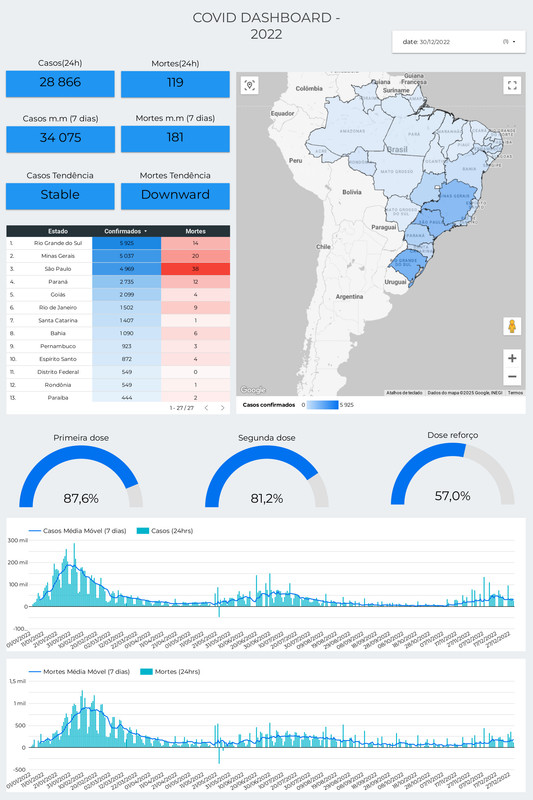
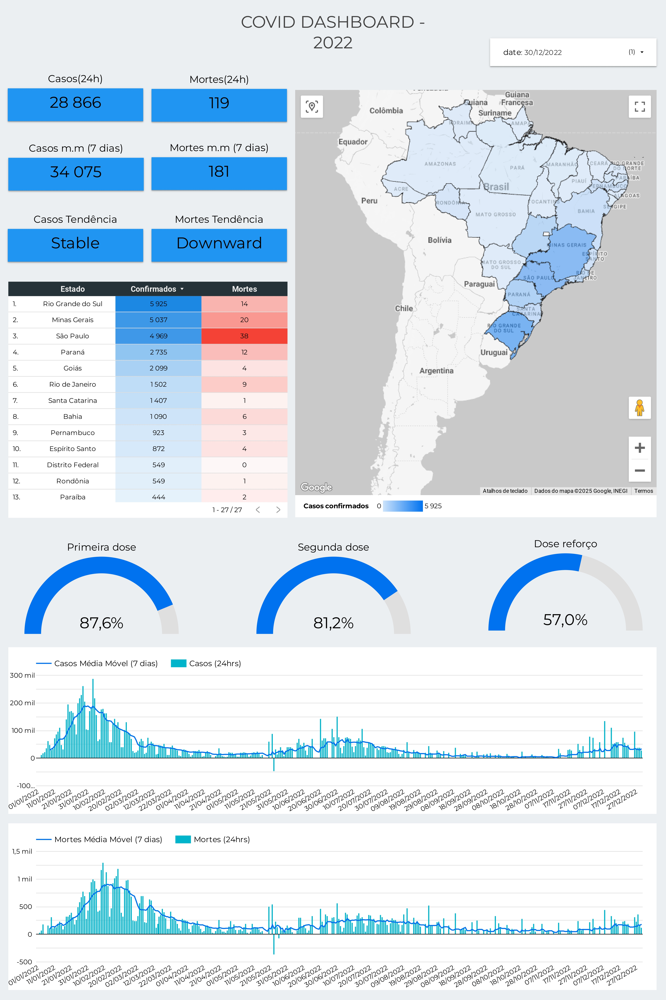
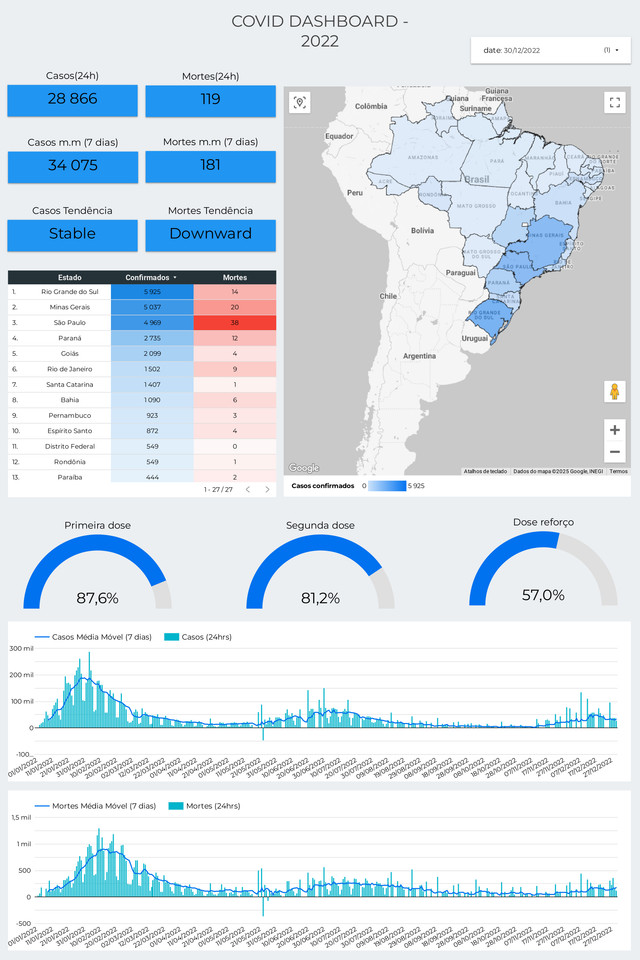
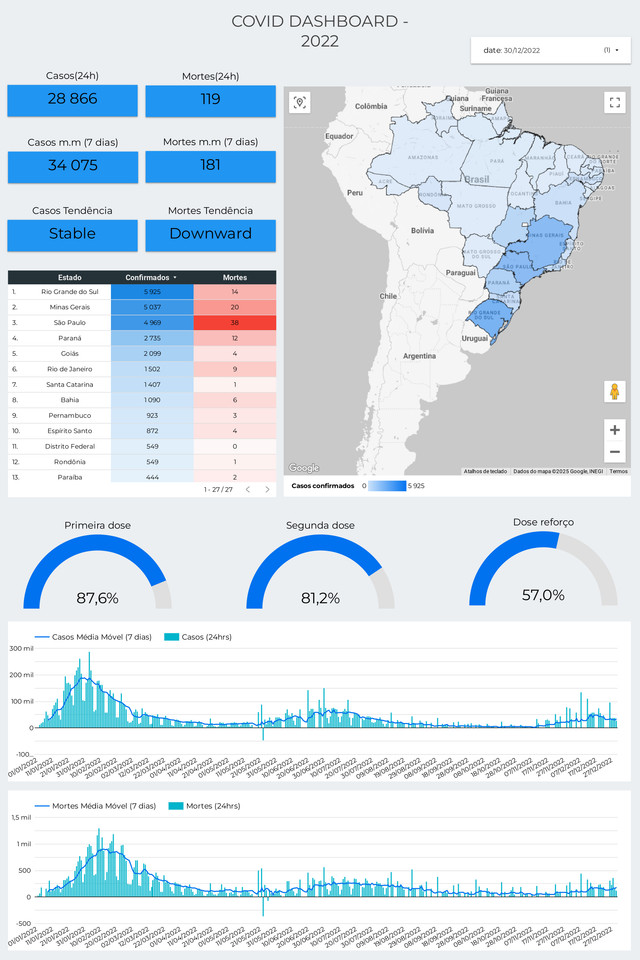
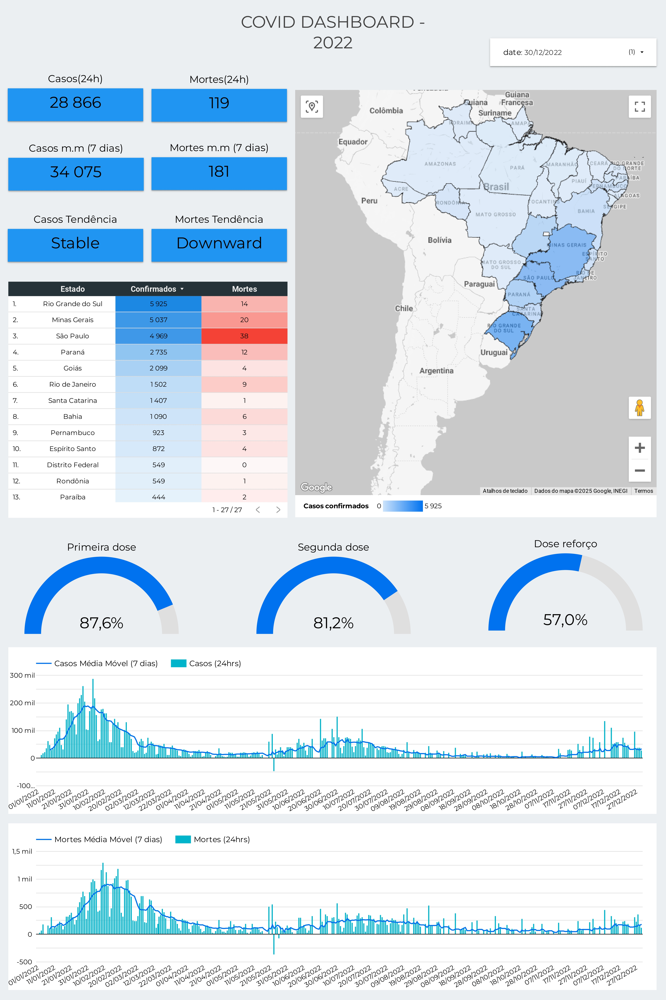
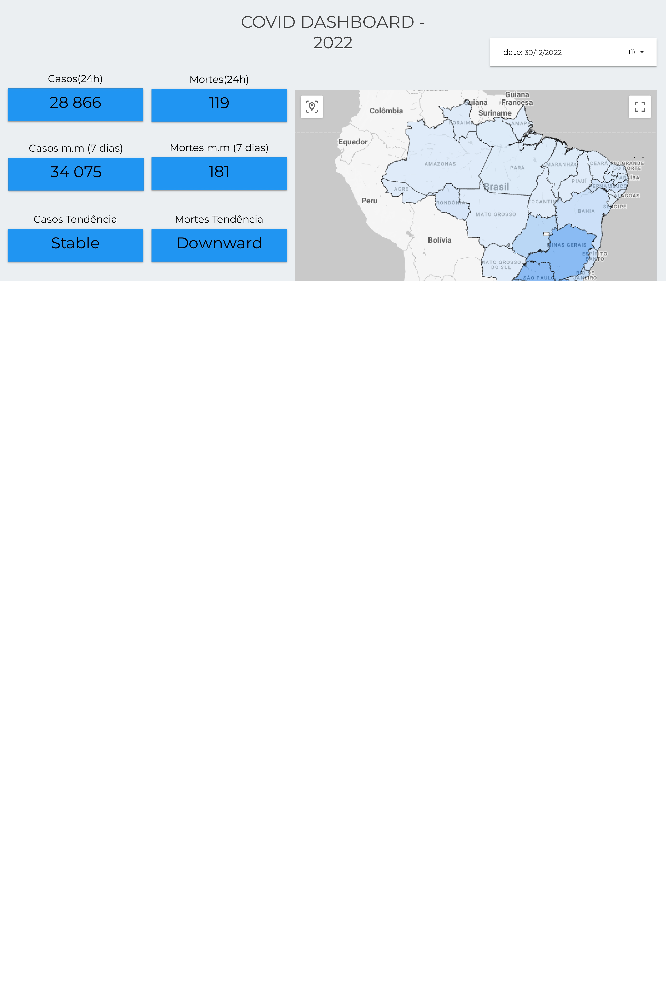
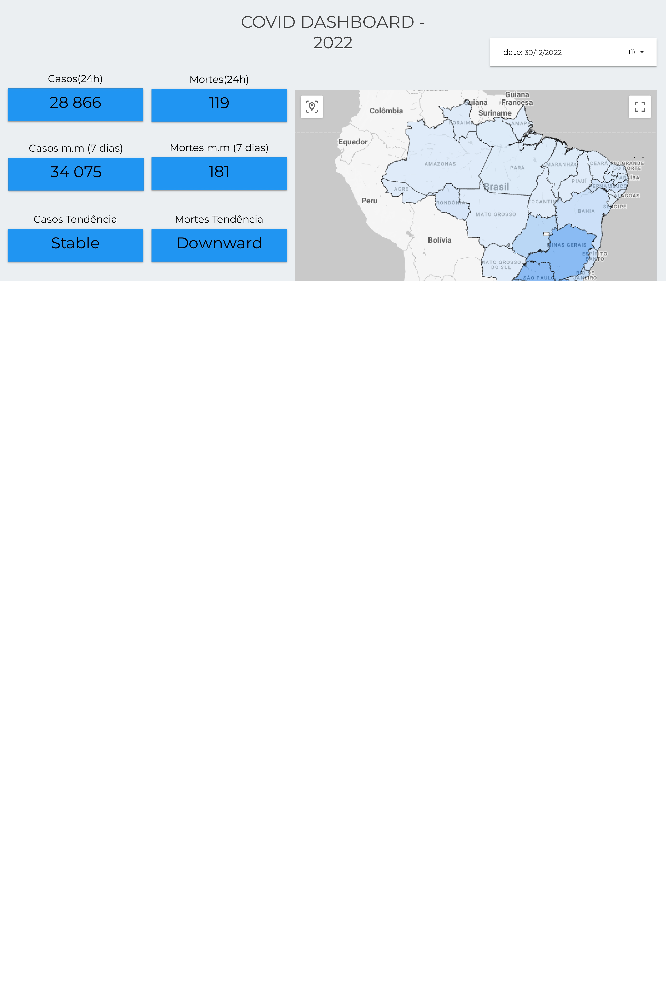
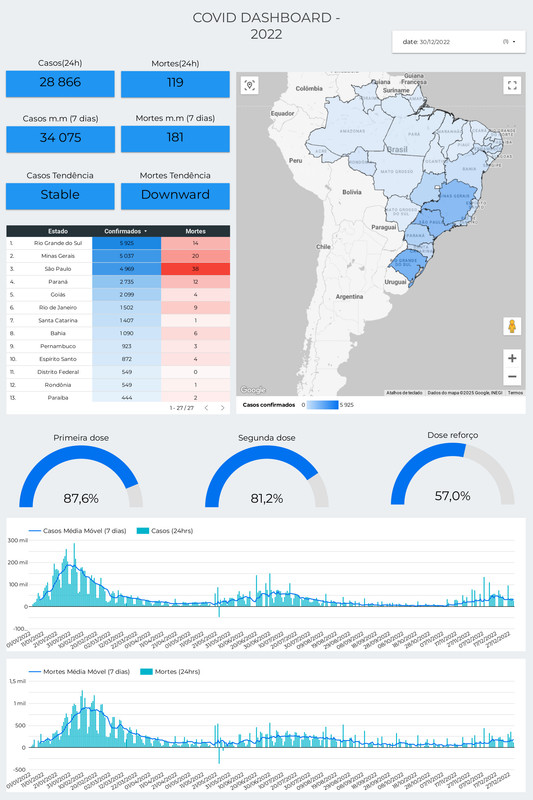
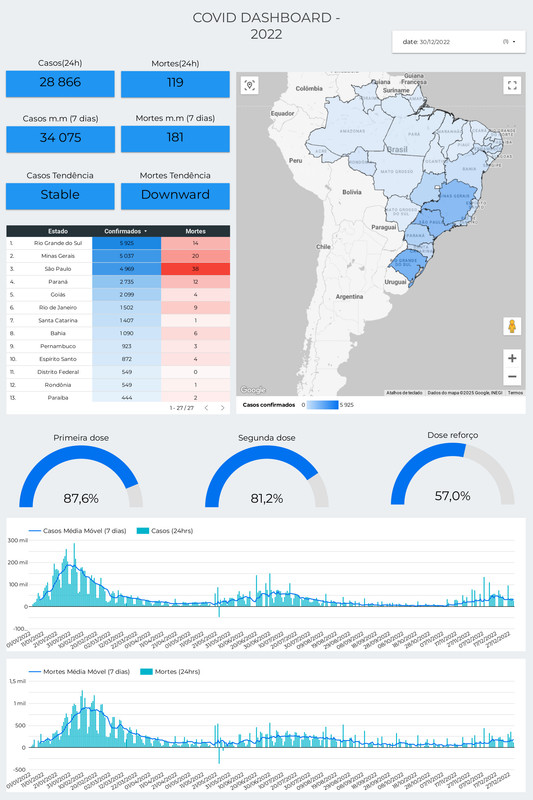
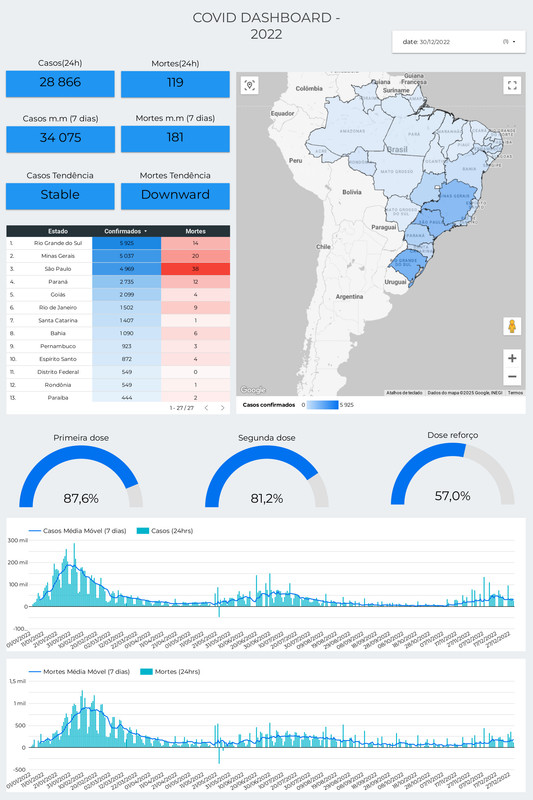

# **Considerações Finais:**

O **ano de 2022** ficou marcado pela **amenização da doença**, com a reabertura dos estabelecimentos, embora a **máscara ainda fosse obrigatória**. Alguns pontos merecem destaque:

- A **taxa de mortalidade** foi de **0,53%** em média. Esse valor pode estar relacionado aos **12,4%** da população que **não tomou a vacina**, ou aos **18,6%** que **não tomaram a segunda dose**. Embora seja **impossível mensurar com exatidão**, há **estudos que comprovam a eficácia das vacinas**.

- As regiões **Sudeste** e **Sul** foram as mais afetadas, registrando os maiores números de casos de COVID e, consequentemente, de mortes. No entanto, isso não significa que outras regiões não tenham enfrentado picos elevados de COVID, especialmente em **datas comemorativas**.

---

### **Reflexão:**
A **vacinação** continua sendo um fator crucial na redução da mortalidade. A dinâmica de disseminação do vírus pode variar conforme as **ações regionais** e o **comportamento social** da população.
